# Waste Segmentation Use Case : Objectives and Goals


The primary objective of this project is to identify the concerns and objectives of stakeholders in the domain of waste management and to establish the importance of effective waste segmentation in mitigating environmental and health risks. The business goal is to develop a computer vision-based solution that can accurately segment biodegradable and non-biodegradable waste, thereby enhancing operational efficiency.


### Key objectives include:

•	Identifying stakeholder concerns and objectives.

•	Establishing the significance of effective waste segmentation.

•	Developing a CV-based solution for accurate waste segmentation.

# Topic : How to Train YOLOv8 Instance Segmentation on a Custom Dataset

---

Ultralytics YOLOv8 is the latest version of the YOLO (You Only Look Once) object detection and image segmentation model developed by Ultralytics. The YOLOv8 model is designed to be fast, accurate, and easy to use, making it an excellent choice for a wide range of object detection and image segmentation tasks. It can be trained on large datasets and is capable of running on a variety of hardware platforms, from CPUs to GPUs.

Read more about Yolov8 in [Ultralytics YOLO Docs](https://docs.ultralytics.com/).

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLOv8
- CLI Basics
- Download & Test Inference with Pre-trained COCO Model
- Roboflow Universe
- Preparing a custom dataset
- Custom Training
- Validate Custom Model
- Inference with Custom Model
- Save the Trained Model to Google Drive

**Let's begin!**

## First Step

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Sat Apr 20 14:12:15 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Second Step

## Install YOLOv8

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 29.1/201.2 GB disk)


## Second Method : To Install Yolov8 -> Download Github repositories from Ultalytics

In [ ]:
# Git clone method (for development)

# %cd {HOME}
# !git clone github.com/ultralytics/ultralytics
# %cd {HOME}/ultralytics
# !pip install -e .

# from IPython import display
# display.clear_output()

# import ultralytics
# ultralytics.checks()

In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

If you want to train, validate or run inference on models and don't need to make any modifications to the code, using YOLO command line interface is the easiest way to get started. Read more about CLI in [Ultralytics YOLO Docs](https://docs.ultralytics.com/usage/cli/).

```
yolo task=detect    mode=train    model=yolov8n.yaml      args...
          classify       predict        yolov8n-cls.yaml  args...
          segment        val            yolov8n-seg.yaml  args...
                         export         yolov8n.pt        format=onnx  args...
```

## Test Inference with Downloaded Pre-trained COCO Model on Test Image

`yolo mode=predict` runs YOLOv8 inference on a variety of sources, downloading models automatically from the latest YOLOv8 release, and saving results to `runs/predict`.

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model=yolov8l-seg.pt conf=0.25 source='https://media.roboflow.com/notebooks/examples/dog.jpeg' save=true

/content
100% 88.1M/88.1M [00:01<00:00, 68.6MB/s]
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45973568 parameters, 0 gradients, 220.5 GFLOPs

100% 104k/104k [00:00<00:00, 102MB/s]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 1 backpack, 97.6ms
Speed: 12.3ms preprocess, 97.6ms inference, 785.6ms postprocess per image at shape (1, 3, 640, 384)
Results saved to runs/segment/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


/content


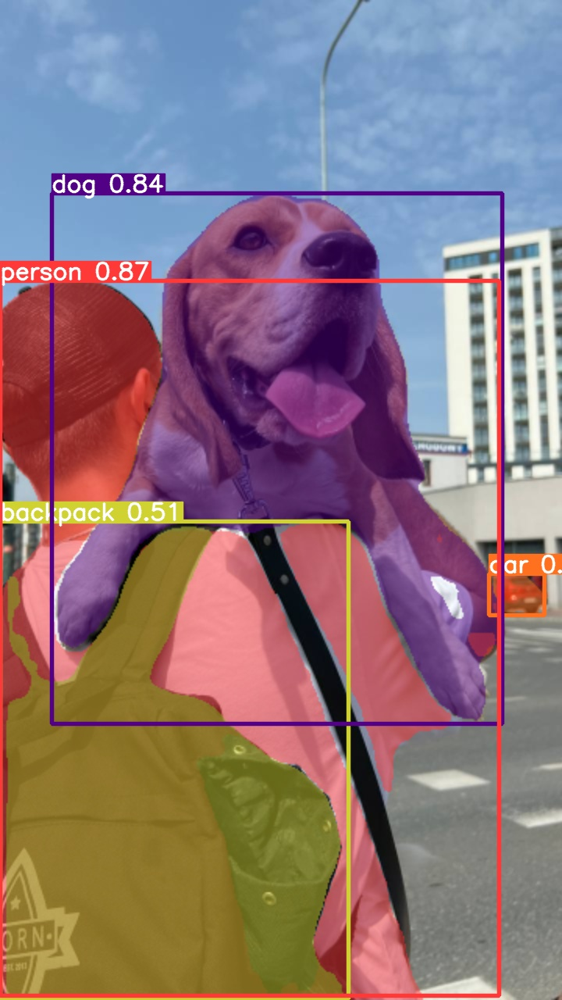

In [ ]:
%cd {HOME}
Image(filename='runs/segment/predict/dog.jpeg', height=600)

## Create Pre-Trained Model Object

In [ ]:
#model = YOLO(f'{HOME}/yolov8s-seg.pt')
model = YOLO(f'{HOME}/yolov8l-seg.pt')
results = model.predict(source='https://media.roboflow.com/notebooks/examples/dog.jpeg', conf=0.25)


Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
image 1/1 /content/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 1 backpack, 88.8ms
Speed: 1.8ms preprocess, 88.8ms inference, 577.9ms postprocess per image at shape (1, 3, 640, 384)


In [ ]:
results[0].boxes.xyxy

tensor([[0.0000e+00, 3.5907e+02, 6.3910e+02, 1.2746e+03],
        [6.6189e+01, 2.4782e+02, 6.4362e+02, 9.2604e+02],
        [6.2643e+02, 7.3485e+02, 6.9796e+02, 7.8761e+02],
        [8.8623e-02, 6.6786e+02, 4.4657e+02, 1.2785e+03]], device='cuda:0')

In [ ]:
results[0].boxes.conf

tensor([0.8692, 0.8398, 0.5771, 0.5094], device='cuda:0')

In [ ]:
results[0].boxes.cls

tensor([ 0., 16.,  2., 24.], device='cuda:0')

In [ ]:
results[0].masks

ultralytics.engine.results.Masks object with attributes:

data: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0.,

In [ ]:
#results[0].masks.masks

## Data preparation on Roboflow


## Preparing a custom dataset

Building a custom dataset can be a painful process.The Process is as per below :

### Step 1: Creating project

Before you start, you need to create a Roboflow [account](https://app.roboflow.com/login). Once you do that, you can create a new project in the Roboflow [dashboard](https://app.roboflow.com/). Keep in mind to choose the right project type. In our case, Object Detection.

<div align="center">
  <img
    width="640"
    src=""
  >
</div>

### Step 2: Uploading images

Next, add the data to your newly created project. You can do it via API or through our [web interface](https://docs.roboflow.com/adding-data/object-detection).

If you drag and drop a directory with a dataset in a supported format, the Roboflow dashboard will automatically read the images and annotations together.

<div align="center">
  <img
    width="640"
    src="https://ik.imagekit.io/roboflow/preparing-custom-dataset-example/uploading-images.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672929808290"
  >
</div>

### Step 3: Generate new dataset version

Now that we have our images and annotations added, we can Generate a Dataset Version. When Generating a Version, you may elect to add preprocessing and augmentations. This step is completely optional, however, it can allow you to significantly improve the robustness of your model.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/generate-new-version.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1673003597834"
  >
</div>

### Step 4: Exporting dataset

Once the dataset version is generated, we have a hosted dataset we can load directly into our notebook for easy training. Click `Export` and select the `YOLO v5 PyTorch` dataset format.

<div align="center">
  <img
    width="640"
    src="https://ik.imagekit.io/roboflow/preparing-custom-dataset-example/export.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672943313709"
  >
</div>




In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

# from roboflow import Roboflow
# rf = Roboflow(api_key="jRlN78c51IOXBvGdBlLu")
# project = rf.workspace("alpaco5-f3woi").project("part-autolabeld")
# dataset = project.version(5).download("yolov8")

# Experiment 1

# from roboflow import Roboflow
# rf = Roboflow(api_key="jRlN78c51IOXBvGdBlLu")
# project = rf.workspace("capstone-ws8ym").project("garbage-segmentation-capstone")
# version = project.version(15)
# dataset = version.download("yolov8")

# Experiment 2

# from roboflow import Roboflow
# rf = Roboflow(api_key="gTgkJc9HFz36YPCqfluC")
# project = rf.workspace("capstoneproject-xockj").project("wastesegment_combineddataset3")
# version = project.version('1')
# dataset = version.download("yolov8")

# Experiment 3

# from roboflow import Roboflow
# rf = Roboflow(api_key="gTgkJc9HFz36YPCqfluC")
# project = rf.workspace("capstoneproject-xockj").project("wastesegment_combineddataset4")
# version = project.version(1)
# dataset = version.download("yolov8")

# Experiment 4

# !pip install roboflow

# from roboflow import Roboflow
# rf = Roboflow(api_key="gTgkJc9HFz36YPCqfluC")
# project = rf.workspace("capstoneproject-xockj").project("wastesegment_combineddataset4")
# version = project.version(2)
# dataset = version.download("yolov8")

#Experiment 5

# !pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="gTgkJc9HFz36YPCqfluC")
project = rf.workspace("capstoneproject-xockj").project("wastesegment_combineddataset5")
version = project.version(1)
dataset = version.download("yolov8")


/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.1/74.1 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.2 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to WasteSegment_CombinedDataset5-1 in yolov8:: 100%|██████████| 4626/4626 [00:00<00:00, 6600.12it/s]


# Fine Tuning on Pre-Trained Yolov8 model on Custom Dataset

## A Brief Introduction to YoloV8

### YOLO is a real-time object detection algorithm that can identify objects in an image and provide their bounding boxes and class probabilities in a single forward pass of a neural network.The original paper of YOLO (“You Only Look Once”) was published in 2016 by Joseph Redmon, Santosh Divvala, Ross Girshick, and Ali Farhadi.

#### Here’s the Original URL to the paper if you want to go through in detail: arxiv.org/abs/1506.02640

#### The authors claim that YOLO is faster and more accurate than previous state-of-the-art object detection systems.

In detail, here is how Yolo works:

1. Dividing the image into a grid: YOLO divides the input image into a grid of cells. Each cell is responsible for detecting objects that fall within its boundaries.
2. Predicting bounding boxes: For each cell, YOLO predicts several bounding boxes, which are defined by their center coordinates, width, height, and confidence score. The confidence score represents how likely the bounding box contains an object.
3. Predicting class probabilities: For each cell and bounding box, YOLO predicts the probability of each object class. The class probabilities are independent of each other, which means that YOLO can detect multiple objects in a single cell.
4. Non-maximum suppression: After predicting the bounding boxes and class probabilities, YOLO uses a technique called non-maximum suppression to eliminate duplicate detections and select the most likely ones.
5. Outputting the results: Finally, YOLO outputs the selected bounding boxes and their associated class probabilities, which represent the detected objects and their locations in the input image.

Since the original Yolo algorithm has been introduced, several versions have been published by researchers:

YOLO V2: Anchor with K-means added, two-stage training, full convolutional network;

YOLO V3: Multi-scale detection by using FPN;

YOLO V4: SPP, MISH activation function, data enhancement Mosaic/Mixup, GIOU(Generalized Intersection over Union) loss function;

YOLO V5: Flexible control of model size, application of Hardswish activation function, and data enhancement

Other recent version : In addition to the Ultralytics implementation I mentioned above, Ultralytics developed later YOLO V6 , YOLO V7 , YOLO V8 & recently they introduced YOLO V9 also. As an Accuracy measures Yolov8 currently produces ~57.9% mAP on standard COCO dataset which has improved a lot since YOLOV5 which was able to give only ~50.3% on standard COCO dataset.

Currently YOLOV9 achieved approximately 59.6% mAP on the COCO dataset, surpassing previous versions like YOLOv8 by 1.7% while using fewer parameters and computational resources.

Apart from above implementation there are several other open-source implementations of YOLO algorithm. Some popular ones are:

Darknet: Darknet is the original implementation of YOLO, developed by Joseph Redmon, one of the authors of the YOLO paper. Darknet is written in C and CUDA, and it supports both CPU and GPU acceleration.

TensorFlow-YOLOv4: This is the most popular implementation of YOLOv4 on GitHub judged by the number of starts. It uses TensorFlow 2.0 and supports both CPU and GPU acceleration.

Keras-YOLOv3: This is an implementation of YOLOv3 developed by qqwweee. It is written in Keras and supports both CPU and GPU acceleration.


Reference: https://medium.com/@yasser.maree/the-story-of-yolo-72cf7dd7d9bc

Reference: https://docs.ultralytics.com/


# yolov8 large model : yolov8l-seg.pt

In [ ]:
!yolo task=segment mode=train model=yolov8l-seg.pt data={dataset.location}/data.yaml epochs=60 imgsz=640

New https://pypi.org/project/ultralytics/8.2.2 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=/content/datasets/WasteSegment_CombinedDataset5-1/data.yaml, epochs=60, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None

# Tensorboard Preparation

# Installation of Tensor Board

In [ ]:
pip install tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

Output hidden; open in https://colab.research.google.com to view.

# Local Output directory on Colab

## Below Results are based on Confusion matrix , Results image & further Validation & Inference Results after completing the training.

#### Note : All the above mentioned training results , Validation & Inference results are shown in the below mentioned folder:

#### Local folder : /content/runs/segment/

In [ ]:
!ls {HOME}/runs/segment/train/

args.yaml					    MaskF1_curve.png	 train_batch6351.jpg
BoxF1_curve.png					    MaskP_curve.png	 train_batch6352.jpg
BoxP_curve.png					    MaskPR_curve.png	 val_batch0_labels.jpg
BoxPR_curve.png					    MaskR_curve.png	 val_batch0_pred.jpg
BoxR_curve.png					    results.csv		 val_batch1_labels.jpg
confusion_matrix_normalized.png			    results.png		 val_batch1_pred.jpg
confusion_matrix.png				    train_batch0.jpg	 val_batch2_labels.jpg
events.out.tfevents.1713622533.a2833987c80d.2915.0  train_batch1.jpg	 val_batch2_pred.jpg
labels_correlogram.jpg				    train_batch2.jpg	 weights
labels.jpg					    train_batch6350.jpg


# Confusion matrix

/content


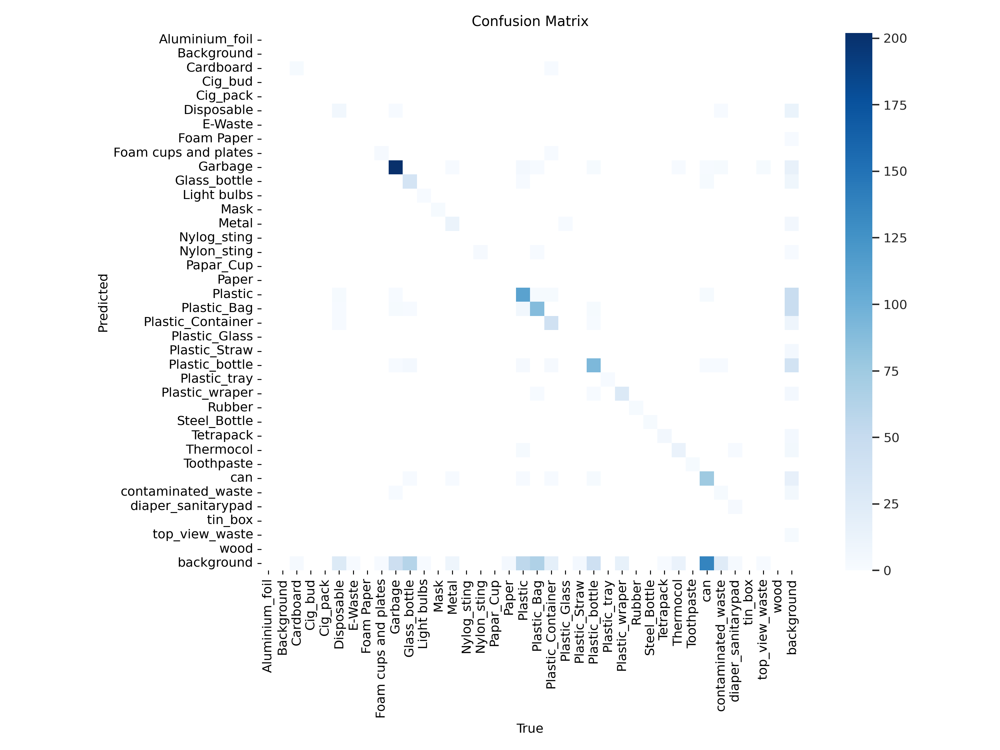

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=1000)

# Display Training Results

/content


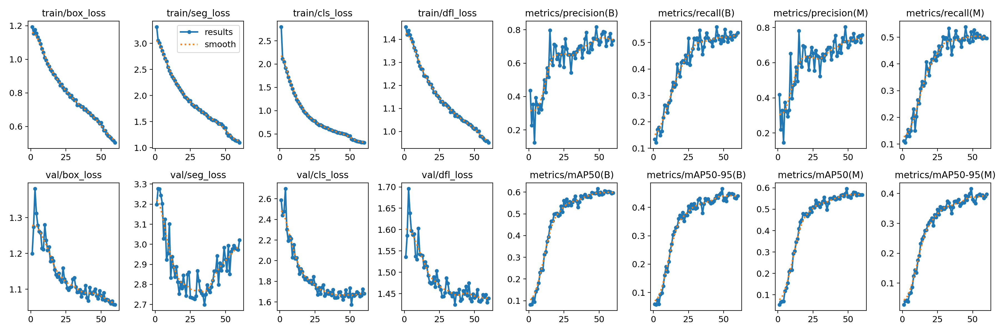

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/results.png', width=1500)

/content


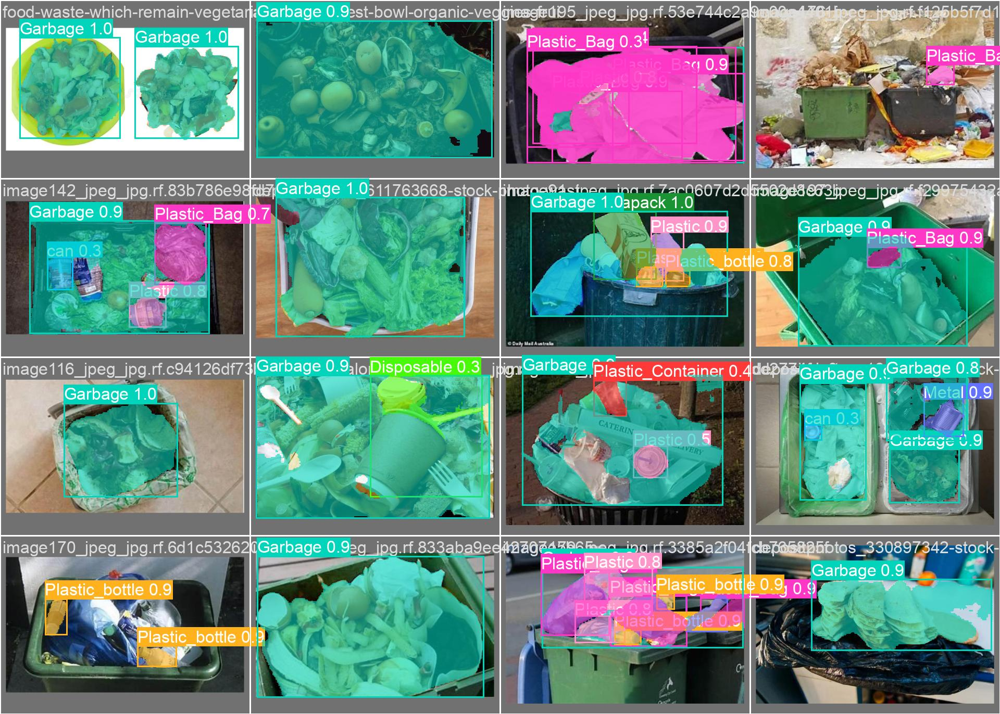

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch0_pred.jpg', width=1000)

/content


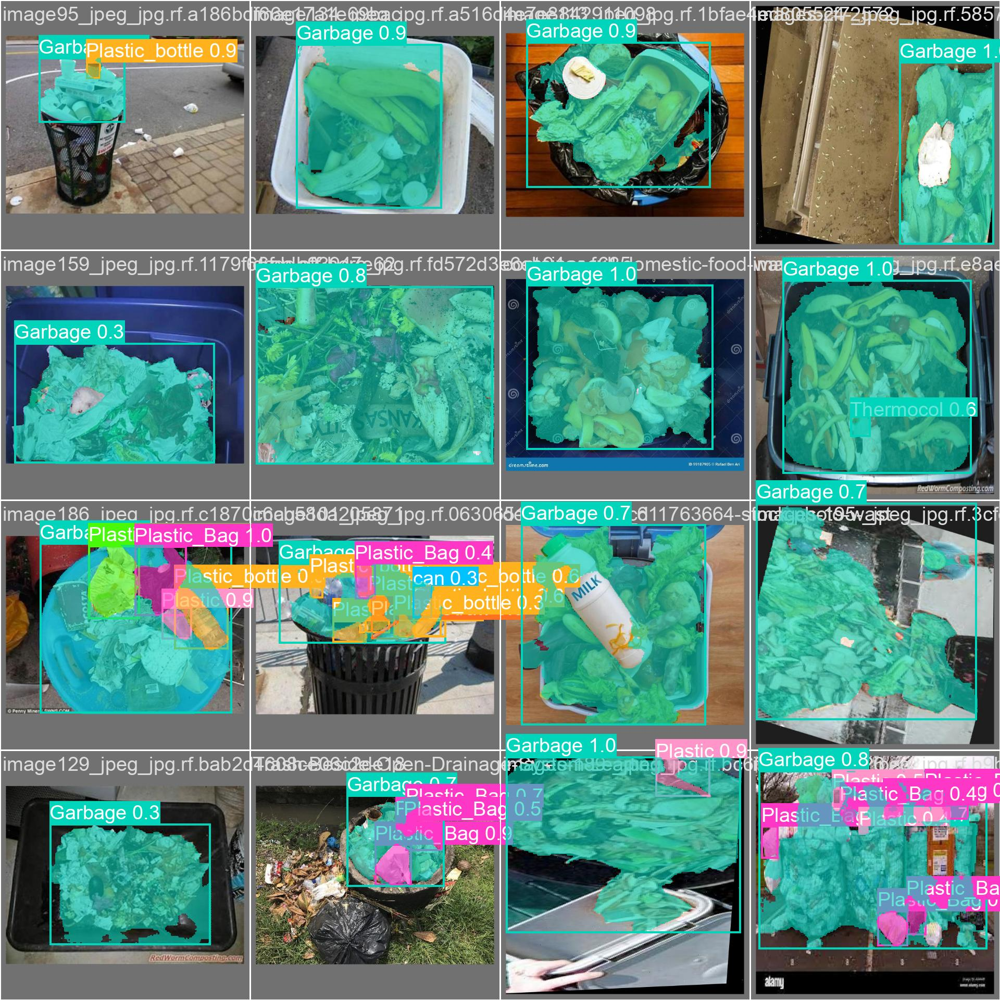

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch1_pred.jpg', width=1000)

/content


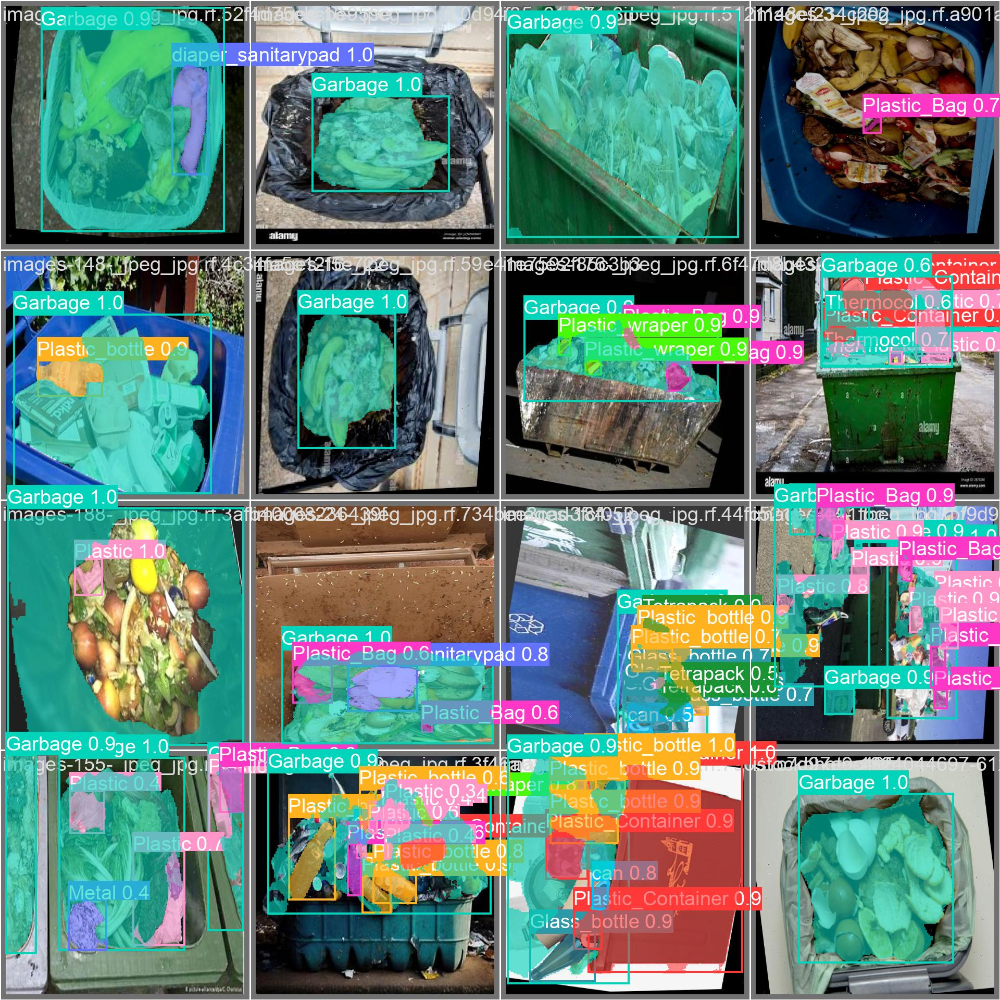

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch2_pred.jpg', width=1000)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=segment mode=val model={HOME}/runs/segment/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45940415 parameters, 0 gradients, 220.3 GFLOPs
val: Scanning /content/datasets/WasteSegment_CombinedDataset5-1/valid/labels.cache... 192 images, 1 backgrounds, 0 corrupt: 100% 192/192 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/WasteSegment_CombinedDataset5-1/valid/images/image256_jpeg_jpg.rf.429af0e4c63bab1936cf56edc44eb805.jpg: 1 duplicate labels removed
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 12/12 [00:12<00:00,  1.01s/it]
                   all        192       1343      0.742      0.516      0.616      0.466      

## Inference with Custom Model

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=true

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45940415 parameters, 0 gradients, 220.3 GFLOPs

image 1/96 /content/datasets/WasteSegment_CombinedDataset5-1/test/images/105-13-_jpg.rf.9dccc072b318bfd61ed0759fb2b4f7bd.jpg: 480x640 2 Garbages, 86.5ms
image 2/96 /content/datasets/WasteSegment_CombinedDataset5-1/test/images/109-12-_jpg.rf.366fa303a81bd65f75019b014bd07b19.jpg: 480x640 1 top_view_waste, 57.9ms
image 3/96 /content/datasets/WasteSegment_CombinedDataset5-1/test/images/113-10-_jpg.rf.0473e5f49bc6a5f1923195f41a3903e6.jpg: 480x640 2 Papers, 57.8ms
image 4/96 /content/datasets/WasteSegment_CombinedDataset5-1/test/images/114-10-_jpg.rf.0f4ac1212479284f6002bd0e99d5723e.jpg: 480x640 1 Disposable, 2 Garbages, 1 Plastic_Glass, 43.7ms
image 5/96 /content/datasets/WasteSegment_CombinedDataset5-1/test/images/WA22-25-09_2728a970_jpg.rf.bee36138fbd5f37b5cdaf7946b06c1d2.jpg: 640x320 1 Disposable, 1 Garba

# Visualization of the above Inferenced Results

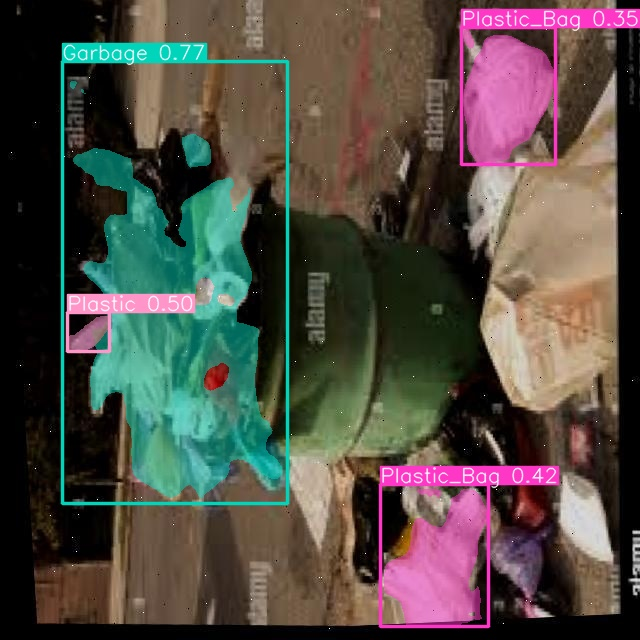

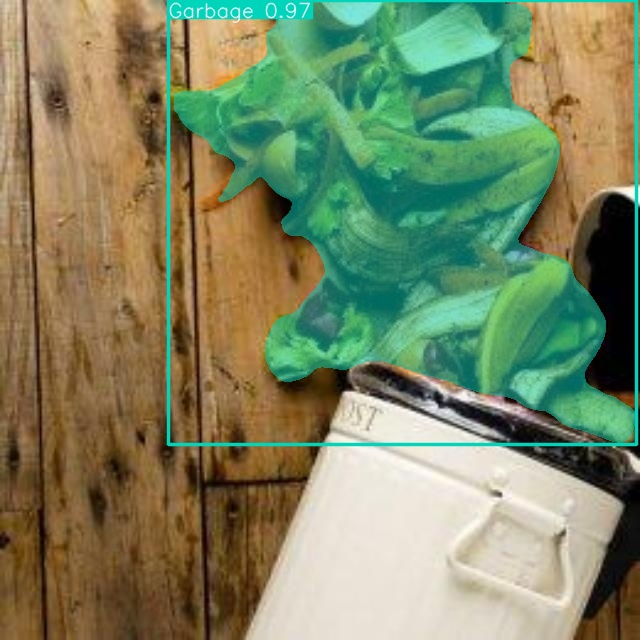

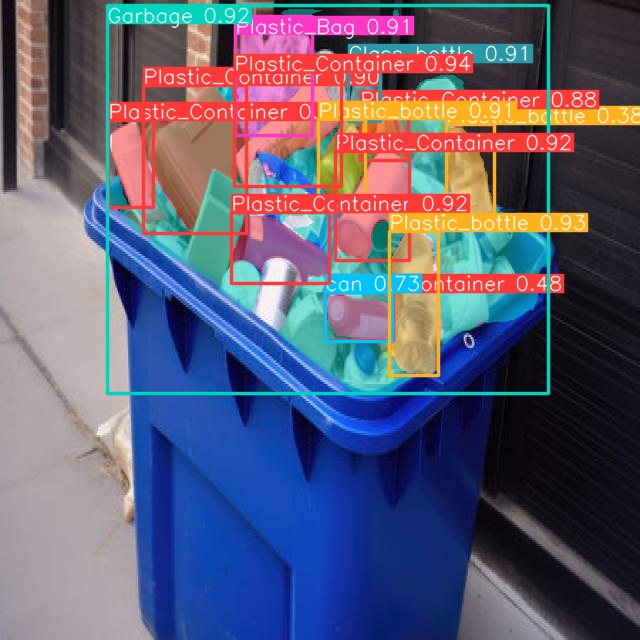

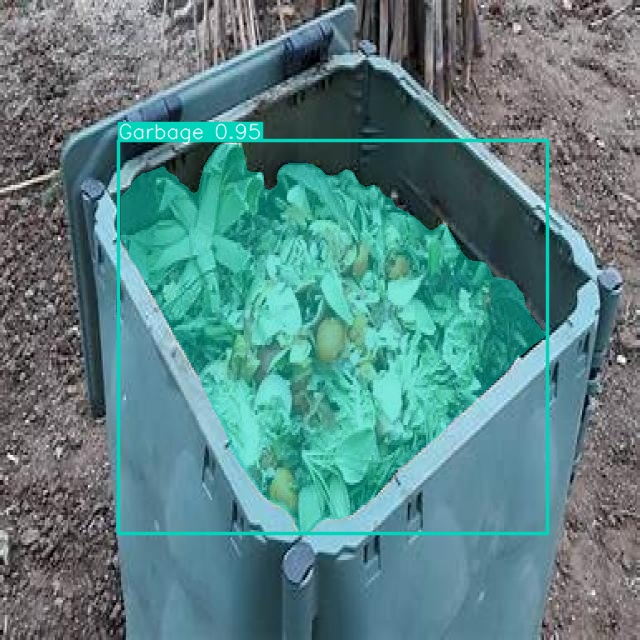

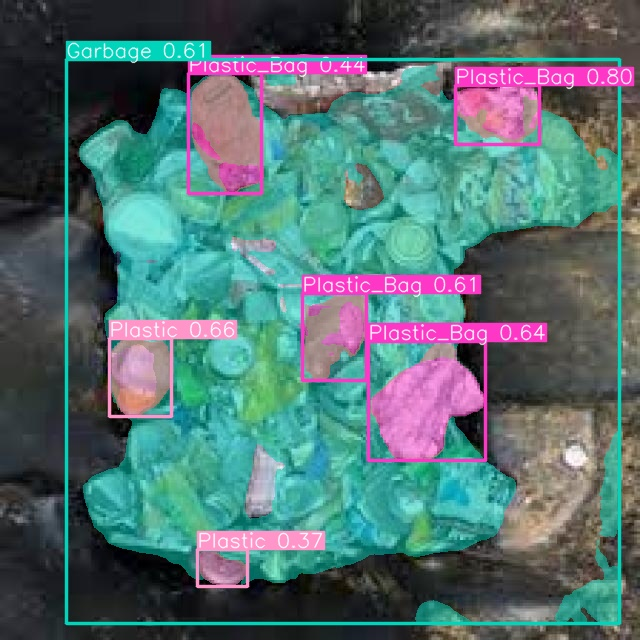

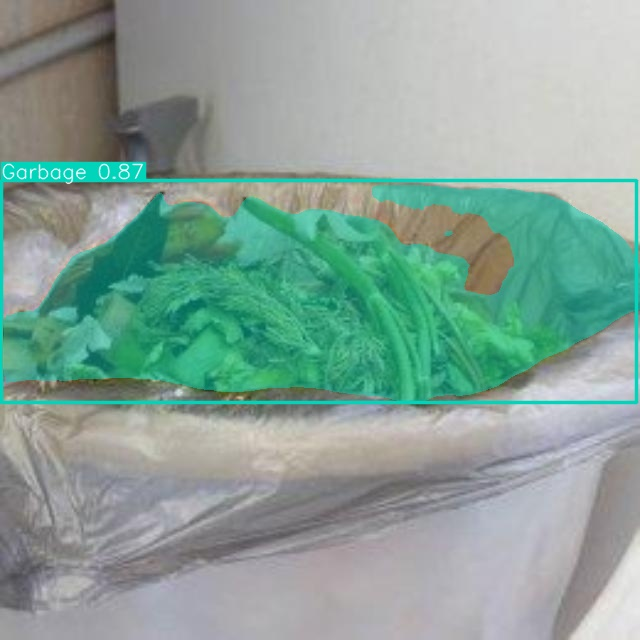

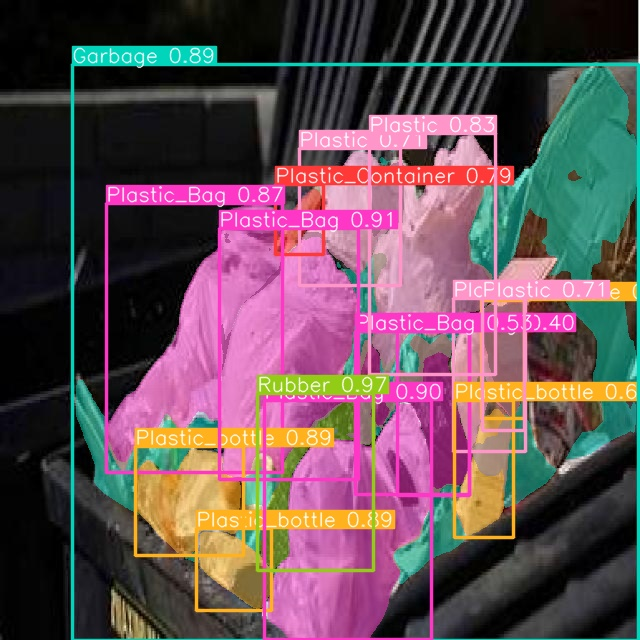

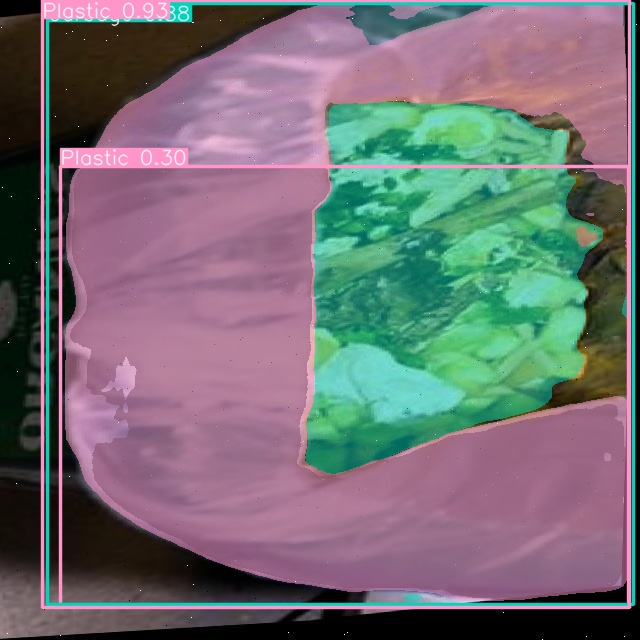

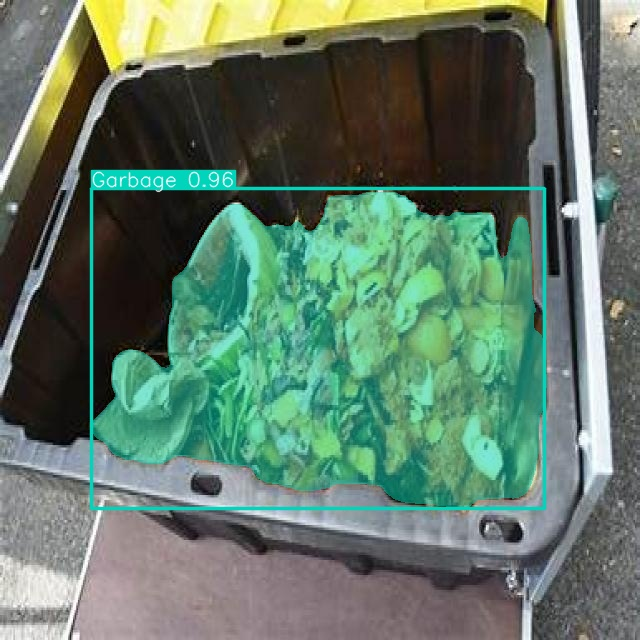

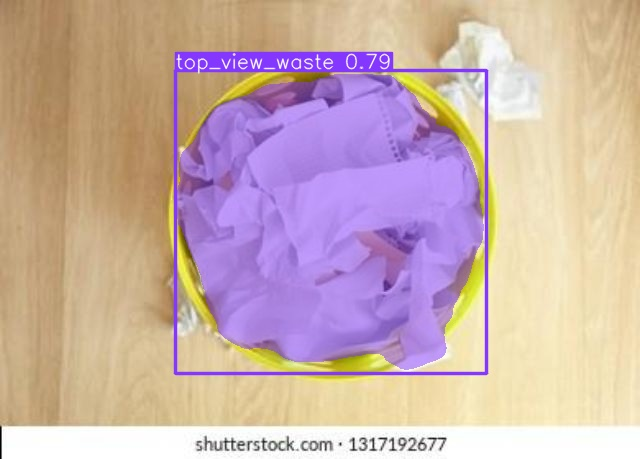

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict2/*.jpg')[:10]:
      display(Image(filename=image_path, height=600))
      print("\n")

# Save the Fine-Tuned model on Google-Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/CapstoneProject/image-segmentation-yolov8-main

 coco8-seg
 config_v1.yaml
 config.yaml
 datasets
 datasets_coco
 datasets_coco_v1
 datasets_old
 datasets_t1
 datasets_t2
 datasets_t3
 datasets-test
 datasets_v2
'Downloading_Your_Dataset_From_Roboflow_In_Python (2).ipynb'
 ISB_AAI_ImageSegmentation_Training_v1.ipynb
 ISB_AAI_ImageSegmentation_Training_v2.ipynb
 LICENSE
 masks_to_polygons.py
 predict.py
 README.md
 requirements.txt
'Roboflow YOLOv8.ipynb'
 runs
 Streamlit_App_for_Image_Segmentation.ipynb
 train.py
 train-yolov8-instance-segmentation-on-custom-dataset_YoloExtraLargeModel.ipynb
 train-yolov8-instance-segmentation-on-custom-dataset_YoloLargeModel_Experiment0_1.ipynb
 train-yolov8-instance-segmentation-on-custom-dataset_YoloLargeModel_Experiment2.ipynb
 train-yolov8-instance-segmentation-on-custom-dataset_YoloLargeModel_Experiment3.ipynb
 train-yolov8-instance-segmentation-on-custom-dataset_YoloMediumModel.ipynb
 train-yolov8-instance-segmentation-on-custom-dataset_YoloNanoModel.ipynb
 train-yolov8-instance-segmentation-

# Save the Model Result on Google Colab

In [ ]:
!cp -r /content/runs /content/drive/MyDrive/CapstoneProject/image-segmentation-yolov8-main/YoloLargeModel_Experiment3

# Thank You for Reading !!